# Outer solar system ($N$ -body problem)

The Hamiltonian system is defined for $N=5$ by
$$
H(q,p)= \frac{1}{2}\sum_{i=0}^5 \frac{1}{m_i}   p_i^\top p_i -G \sum_{i=1}^5 \sum_{j=0}^{i-1} \frac{m_i m_j}{\|  q_i-  q_j\|},\qquad q_i,p_i\in \mathbb R^3$$
Here $\|\cdot\|$ is the Euclidean norm in $\mathbb R^3$ and $G$ is constant. The corresponding Hamiltonian system takes the form  

\begin{align*}
\dot q_i &= \frac{1}{m_i} p_i\\
\dot p_i &= \sum_{j\in \{1,\ldots,5\}\setminus i} G\frac{m_i\, m_j}{\|  q_j-  q_i\|^3}(q_j-q_i)
\end{align*}

# The consered quantities of the outer solar system are 
1.  The Hamiltonian (or total energy) $H(q,p)$
2.  The total linear  momentum and  angular momentum

$$ P= \sum_{i=0}^5 p_i,\qquad L= \sum_{i=0}^5 q_i\times p_i  $$


In [1]:
# parameters =   Gravity and planets masses

function parameters()
G = 2.95912208286e-4; # universal gravitational constant
m0 = 1.00000597682;  # Sun + Inner Planets
m1 = 0.000954786104043; # Jupiter
m2 = 0.000285583733151; # Saturn
m3 = 0.0000437273164546; # Uranus
m4 = 0.0000517759138449; # Neptune
m5 = 1/(1.3e8); # Pluto

y= [G, m0, m1, m2, m3, m4, m5];
    
return y
end

parameters (generic function with 1 method)

In [2]:
# fSolar = Hamiltonian vector field of solar system
using LinearAlgebra

function fSolar(x)
    
y = parameters();  

G =y[1];    
m0=y[2];       
m1=y[3];  
m2=y[4];
m3=y[5];
m4=y[6];
m5=y[7];

q0=x[1:3];  q1=x[4:6];  q2=x[7:9];  q3=x[10:12];  q4=x[13:15];  q5=x[16:18];
    
p0=x[19:21];  p1=x[22:24];  p2=x[25:27];  p3=x[28:30];  p4=x[31:33];  p5=x[34:36];


Ydot = vcat(p0/m0, p1/m1, p2/m2, p3/m3, p4/m4, p5/m5,
    G*m0*(m1/((norm(q1-q0))^3)*(q1-q0) + m2/((norm(q2-q0))^3)*(q2-q0) + m3/((norm(q3-q0))^3)*(q3-q0) + m4/((norm(q4-q0))^3)*(q4-q0) + m5/((norm(q5-q0))^3)*(q5-q0)),
    G*m1*(m0/((norm(q1-q0))^3)*(q0-q1) + m2/((norm(q2-q1))^3)*(q2-q1) + m3/((norm(q3-q1))^3)*(q3-q1) + m4/((norm(q4-q1))^3)*(q4-q1) + m5/((norm(q5-q1))^3)*(q5-q1)),
    G*m2*(m0/((norm(q2-q0))^3)*(q0-q2) + m1/((norm(q2-q1))^3)*(q1-q2) + m3/((norm(q3-q2))^3)*(q3-q2) + m4/((norm(q4-q2))^3)*(q4-q2) + m5/((norm(q5-q2))^3)*(q5-q2)),
    G*m3*(m0/((norm(q3-q0))^3)*(q0-q3) + m1/((norm(q3-q1))^3)*(q1-q3) + m2/((norm(q3-q2))^3)*(q2-q3) + m4/((norm(q4-q3))^3)*(q4-q3) + m5/((norm(q5-q3))^3)*(q5-q3)),
    G*m4*(m0/((norm(q4-q0))^3)*(q0-q4) + m1/((norm(q4-q1))^3)*(q1-q4) + m2/((norm(q4-q2))^3)*(q2-q4) + m3/((norm(q4-q3))^3)*(q3-q4) + m5/((norm(q5-q4))^3)*(q5-q4)),
    G*m5*(m0/((norm(q5-q0))^3)*(q0-q5) + m1/((norm(q5-q1))^3)*(q1-q5) + m2/((norm(q5-q2))^3)*(q2-q5) + m3/((norm(q5-q3))^3)*(q3-q5) + m4/((norm(q5-q4))^3)*(q4-q5)));

return Ydot;
    
end

fSolar (generic function with 1 method)

In [3]:
# fSolarT = first Hamiltonian vector field of solar system
# fSolarV = second Hamiltonian vector field of solar system

function fSolarT(p)   
y = parameters();  
G =y[1];
m0=y[2]; 
m1=y[3];  
m2=y[4];
m3=y[5];
m4=y[6];
m5=y[7];
    
p0=p[1:3];  p1=p[4:6];  p2=p[7:9];  p3=p[10:12];  p4=p[13:15];  p5=p[16:18];

Qdot = vcat(p0/m0, p1/m1, p2/m2, p3/m3, p4/m4, p5/m5);

return Qdot;
    
end

function fSolarV(q)
    
y = parameters();  

G =y[1]; 
m0=y[2];  
m1=y[3];  
m2=y[4];
m3=y[5];
m4=y[6];
m5=y[7];

q0=q[1:3];  q1=q[4:6];  q2=q[7:9];  q3=q[10:12];  q4=q[13:15];  q5=q[16:18];

Pdot = vcat(
    G*m0*(m1/((norm(q1-q0))^3)*(q1-q0) + m2/((norm(q2-q0))^3)*(q2-q0) + m3/((norm(q3-q0))^3)*(q3-q0) + m4/((norm(q4-q0))^3)*(q4-q0) + m5/((norm(q5-q0))^3)*(q5-q0)),
    G*m1*(m0/((norm(q1-q0))^3)*(q0-q1) + m2/((norm(q2-q1))^3)*(q2-q1) + m3/((norm(q3-q1))^3)*(q3-q1) + m4/((norm(q4-q1))^3)*(q4-q1) + m5/((norm(q5-q1))^3)*(q5-q1)),
    G*m2*(m0/((norm(q2-q0))^3)*(q0-q2) + m1/((norm(q2-q1))^3)*(q1-q2) + m3/((norm(q3-q2))^3)*(q3-q2) + m4/((norm(q4-q2))^3)*(q4-q2) + m5/((norm(q5-q2))^3)*(q5-q2)),
    G*m3*(m0/((norm(q3-q0))^3)*(q0-q3) + m1/((norm(q3-q1))^3)*(q1-q3) + m2/((norm(q3-q2))^3)*(q2-q3) + m4/((norm(q4-q3))^3)*(q4-q3) + m5/((norm(q5-q3))^3)*(q5-q3)),
    G*m4*(m0/((norm(q4-q0))^3)*(q0-q4) + m1/((norm(q4-q1))^3)*(q1-q4) + m2/((norm(q4-q2))^3)*(q2-q4) + m3/((norm(q4-q3))^3)*(q3-q4) + m5/((norm(q5-q4))^3)*(q5-q4)),
    G*m5*(m0/((norm(q5-q0))^3)*(q0-q5) + m1/((norm(q5-q1))^3)*(q1-q5) + m2/((norm(q5-q2))^3)*(q2-q5) + m3/((norm(q5-q3))^3)*(q3-q5) + m4/((norm(q5-q4))^3)*(q4-q5)));

return Pdot;
    
end

fSolarV (generic function with 1 method)

In [4]:
# Constants = the invariants: Hamiltonian, angular and linear momentum 

function Constants(q,p,N)
    
H = zeros(N); #  Hamiltonian     
L = zeros(3,N); # Angular momentum 
P = zeros(3,N); # Linear momentum   
y = parameters();   m = y[2:7];     G = y[1];

   
for k in 1:N
T = 0;
V = 0;
L_ang = zeros(3);
L_lin = zeros(3);
        
for j = 1:length(m)
  T = T + (p[k,3*j-2:3*j]' *p[k,3*j-2:3*j] )/(2*m[j]);
  L_lin = L_lin +  p[k,3*j-2:3*j]          
  L_ang = L_ang + cross(q[k,3*j-2:3*j],p[k,3*j-2:3*j]);            
end
        
for i = 1:length(m)
    for j = 1:i-1
          V = V + m[j]*m[i]/norm(q[k,3*i-2:3*i]-q[k,3*j-2:3*j] );
    end    
end        

H[k] = T-G*V;
L[:,k] = L_lin
P[:,k] = L_ang         
        
end      
    
return H,L,P;
       
end

Constants (generic function with 1 method)

# Data for the outer solar system 

The following ref. Geometric Numerical Integration (page 14, Hairer and et al. )

In [5]:
y = parameters();  

G =y[1];     
m0=y[2];          
m1=y[3];  
m2=y[4];
m3=y[5];
m4=y[6];
m5=y[7];

q0_0=[0.0000000, 0.0000000, 0.0000000];          v0_0 = [0.00000000, 0.00000000, 0.00000000];
q1_0=[-3.5023653, -3.8169847, -1.5507963];       v1_0 = [0.00565429, -0.00412490, -0.00190589];
q2_0=[+9.0755314, -3.0458353, -1.6483708];       v2_0 = [0.00168318, 0.00483525, 0.00192462];
q3_0=[+08.3101420, -16.2901086, -7.2521278];     v3_0 = [0.00354178, 0.00137102, 0.00055029];
q4_0=[+11.4707666, -25.7294829, -10.8169456];    v4_0 = [0.00288930, 0.00114527, 0.00039677];
q5_0=[-15.5387357, -25.2225594, -3.1902382];     v5_0 = [0.00276725, -0.00170702, -0.00136504];

q0=vcat(q0_0, q1_0, q2_0, q3_0, q4_0, q5_0);
p0=vcat(m0*v0_0, m1*v1_0, m2*v2_0, m3*v3_0, m4*v4_0, m5*v5_0);

# radii (km)
r = [696342, # Sun + Inner Planets
    69911, # Jupiter
    58232, # Saturn
    25362, # Uranus
    24622, # Neptune
    1184] # Pluto
bodysize = 100;

# Explicit Euler

In [24]:
function  eulerE(f::Function,T,x₀,N)
h = T / N; x=[] ; push!(x,x₀); 
    
for i in 1:N; 
  x₀ = x₀ + h * f(x₀);
  push!(x,x₀)
end
    return  stack(x, dims=2)'; 
end

eulerE (generic function with 1 method)

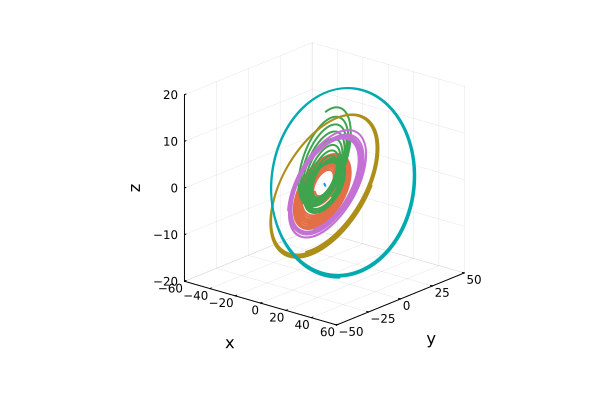

In [25]:
T=200000;   N=20000;   # h = 10

x₀=vcat(q0,p0);

s = eulerE(fSolar,T,x₀,N)

q1 = s[:,1:18]
p1 = s[:,19:36]

using Plots;# gr(size=(800,900)); pyplot()


plot3d(q1[:,1],q1[:,2],q1[:,3],lw=2)
plot3d!(q1[:,4],q1[:,5],q1[:,6],lw=2)
plot3d!(q1[:,7],q1[:,8],q1[:,9],lw=2)
plot3d!(q1[:,10],q1[:,11],q1[:,12],lw=2)
plot3d!(q1[:,13],q1[:,14],q1[:,15],lw=2)
plot3d!(q1[:,16],q1[:,17],q1[:,18],lw=2)
plot3d!(xlims=(-60,60),ylims=(-50,50),zlims=(-20,20),xlabel="x",ylabel="y",zlabel="z",legend=false,camera = (40, 20))

In [27]:
H1,A1,L1=Constants(q1 ,p1 ,N+1);
t1=(0:N)*T/N;

# Implicit mid point

In [28]:
function  implicit_mid_point(f::Function,T,x₀,N)
    
h = T / N; x=[] ; push!(x,x₀); 
    
tol = 1e-10;   K1 = f(x₀);
    
for i in 1:N

K1_0 = K1;   
        
while true        
        
 K1 = f(x₀ + h * K1_0 / 2);
            
if norm(K1-K1_0) < tol 
break
end
 K1_0=K1; 
end
            
x₀ = x₀ + h * K1;  
        
  push!(x,x₀);
        
end
    return stack(x, dims=2)'; 
end

implicit_mid_point (generic function with 1 method)

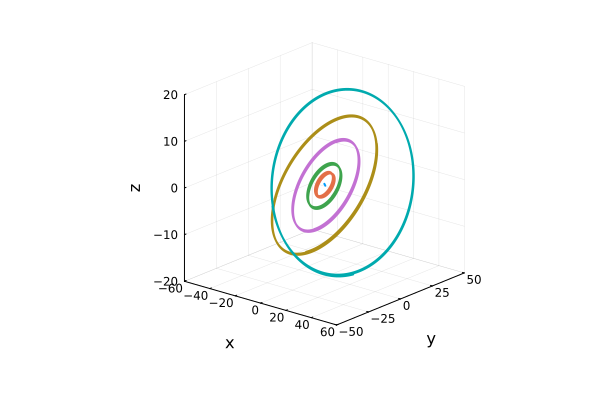

In [29]:
T=200000;   N=2000;  # h =  100

x₀ = vcat(q0,p0);

s = implicit_mid_point(fSolar,T,x₀,N);

q2 = s[:,1:18];
p2 = s[:,19:36]

using Plots; #gr(size=(800,900)); pyplot()
plot3d(q2[:,1],q2[:,2],q2[:,3],lw=2)
plot3d!(q2[:,4],q2[:,5],q2[:,6],lw=2)
plot3d!(q2[:,7],q2[:,8],q2[:,9],lw=2)
plot3d!(q2[:,10],q2[:,11],q2[:,12],lw=2)
plot3d!(q2[:,13],q2[:,14],q2[:,15],lw=2)
plot3d!(q2[:,16],q2[:,17],q2[:,18],lw=2)
plot3d!(xlims=(-60,60),ylims=(-50,50),zlims=(-20,20),xlabel="x",ylabel="y",zlabel="z",legend=false,camera = (40, 20))

In [30]:
H2,A2,L2=Constants(q2 ,p2 ,N+1);
t2=(0:N)*T/N;

# Runge_Kutta of order 4 (RK4)

In [33]:
function  RK4(f::Function,T,x₀,N)
h = T / N; x=[] ; push!(x,x₀);
for i in 1:N;
  K1 = f(x₀)     
  K2 = f(x₀ + h * K1 / 2);
  K3 = f(x₀ + h * K2 / 2);
  K4 = f(x₀ + h * K3);
x₀ = x₀ + h * (K1 + 2 * K2 + 2 * K3 + K4) / 6;  
  push!(x,x₀)
end
    return stack(x, dims=2)'; 
end

RK4 (generic function with 1 method)

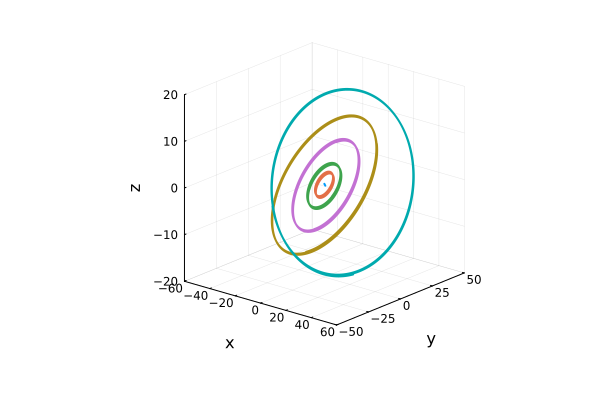

In [34]:
T=200000;   N=20000;  # h = 10


s = RK4(fSolar,T,x₀,N)

q3 = s[:,1:18];
p3 = s[:,19:36];


H3,A3,L3=Constants(q3 ,p3 ,N+1);
t3=(0:N)*T/N;

#gr(size=(800,900)); pyplot()


plot3d(q3[:,1],q3[:,2],q3[:,3],lw=2)
plot3d!(q3[:,4],q3[:,5],q3[:,6],lw=2)
plot3d!(q3[:,7],q3[:,8],q3[:,9],lw=2)
plot3d!(q3[:,10],q3[:,11],q3[:,12],lw=2)
plot3d!(q3[:,13],q3[:,14],q3[:,15],lw=2)
plot3d!(q3[:,16],q3[:,17],q3[:,18],lw=2)
plot3d!(xlims=(-60,60),ylims=(-50,50),zlims=(-20,20),xlabel="x",ylabel="y",zlabel="z",legend=false,camera = (40, 20))

In [35]:
H3,A3,L3=Constants(q3 ,p3 ,N+1);
t3=(0:N)*T/N;

# Symplectic Euler

In [36]:
function  eulerTV(fT,fV,T,q₀,p₀,N)
 h = T/N;
    
q=[] ; push!(q,q₀);  p=[] ; push!(p,p₀); q₁ = q₀; p₁ = p₀; 
    
 for i=1:N;
   q₁ = q₁ + h * fT(p₁);
   p₁ = p₁ + h * fV(q₁);
   push!(q,q₁);
   push!(p,p₁);
 end
  return stack(q, dims=2)', stack(p, dims=2)'; 
end

eulerTV (generic function with 1 method)

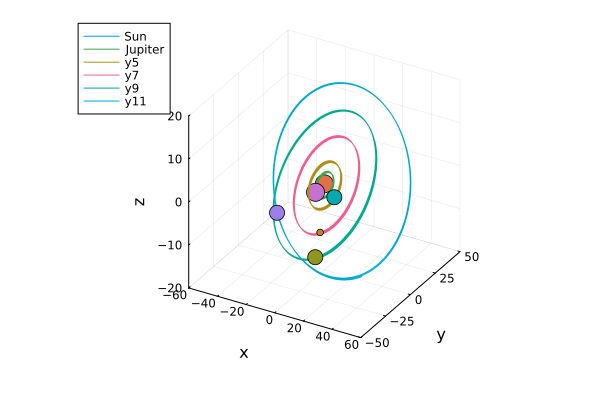

In [37]:
T=200000;   N=2000; # h = 100

q₀=q0;  p₀=p0; 

s1,s2 = eulerTV(fSolarT,fSolarV,T,q₀,p₀,N);

q4 = s1[:,1:18]
p4 = s2[:,1:18]


#gr(size=(800,900)); pyplot()

    
plot3d(q4[:,1],q4[:,2],q4[:,3], label="Sun")
scatter3d!([q4[1,1]],[q4[1,2]],[q4[1,3]], ms = 10,label="")

plot3d!(q4[:,4],q4[:,5],q4[:,6],label="Jupiter")
scatter3d!([q4[1,4]],[q4[1,5]],[q4[1,6]], ms = bodysize*r[2]/r[1],label="")
H2,A2,L2=Constants(q2 ,p2 ,N+1);
t2=(0:N)*T/N;
plot3d!(q4[:,7],q4[:,8],q4[:,9])
scatter3d!([q4[1,7]],[q4[1,8]],[q4[1,9]], ms = bodysize*r[3]/r[1],label="")

plot3d!(q4[:,10],q4[:,11],q4[:,12])
scatter3d!([q4[1,10]],[q4[1,11]],[q4[1,12]], ms = bodysize*r[4]/r[1],label="")

plot3d!(q4[:,13],q4[:,14],q4[:,15])
scatter3d!([q4[1,13]],[q4[1,14]],[q4[1,15]], ms = bodysize*r[3]/r[1],label="")

plot3d!(q4[:,16],q4[:,17],q4[:,18])
scatter3d!([q4[1,16]],[q4[1,17]],[q4[1,18]], ms = bodysize*r[3]/r[1],label="")

plot3d!(xlims=(-60,60),ylims=(-50,50),zlims=(-20,20),xlabel="x",ylabel="y",zlabel="z")

In [38]:
H4,A4,L4=Constants(q4 ,p4 ,N+1);
t4=(0:N)*T/N;

# Stormer-Verlet

In [39]:
function  Stormer_Verlet(fT,fV,T,q₀,p₀,N)
    
 h = T/N;
 q=[] ; push!(q,q₀);  p=[] ; push!(p,p₀); q₁ = q₀; p₁ = p₀; 
    
 for i=1:N;
    q̄ = q₁ + (h/2) * fT(p₁);
   p₁ = p₁ + h * fV(q̄);    
   q₁ = q̄ + (h/2) * fT(p₁);
   
   push!(q,q₁);
   push!(p,p₁);
 end
  return stack(q, dims=2)', stack(p, dims=2)'; 
end

Stormer_Verlet (generic function with 1 method)

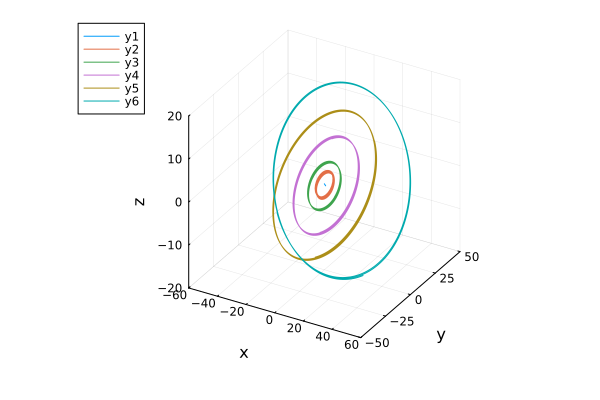

In [40]:

T=200000;   N=1000; # h = 200

q₀=q0;  p₀=p0; 

s1,s2=Stormer_Verlet(fSolarT,fSolarV,T,q₀,p₀,N);

q5 = s1[:,1:18]
p5 = s2[:,1:18]

#gr(size=(800,900)); pyplot()

    
plot3d(q5[:,1],q5[:,2],q5[:,3])

plot3d!(q5[:,4],q5[:,5],q5[:,6])

plot3d!(q5[:,7],q5[:,8],q5[:,9])

plot3d!(q5[:,10],q5[:,11],q5[:,12])

plot3d!(q5[:,13],q5[:,14],q5[:,15])

plot3d!(q5[:,16],q5[:,17],q5[:,18])

plot3d!(xlims=(-60,60),ylims=(-50,50),zlims=(-20,20),xlabel="x",ylabel="y",zlabel="z")

In [41]:
H5,A5,L5=Constants(q5 ,p5 ,N+1);
t5=(0:N)*T/N;

# Lobatto IIIA-IIIB

In [42]:
function  Lobatto_IIIA_IIIB(fV::Function,fT::Function,T,x₀,y₀,N)
    
h = T / N; x=[] ; push!(x,x₀); y=[] ; push!(y,y₀);

tol = 1e-12;    
    
a = [0  0  0 ; 5/24  1/3  -1/24 ; 1/6  2/3  1/6];   
â = [1/6  -1/6  0 ; 1/6 1/3  0 ; 1/6  5/6  0];    

b = [1/6 , 2/3 , 1/6] ;   

    
 K1 = fV(y₀); 
 L1 = fT(x₀);  
    
 K2 = K1 ;  K3 = K1 ; L2 = L1 ; L3 = L1;
    
for i in 1:N;

K1_0 = K1;    K2_0 = K2; K3_0 = K3;
L1_0 = L1;    L2_0 = L2; L3_0 = L3;

while true        
        
K1 = fV(y₀+h*(â[1,1]*L1_0+â[1,2]*L2_0+â[1,3]*L3_0));
L1 = fT(x₀+h*(a[1,1]*K1_0+a[1,2]*K2_0+a[1,3]*K3_0));

K2 = fV(y₀+h*(â[2,1]*L1_0+â[2,2]*L2_0+â[2,3]*L3_0));
L2 = fT(x₀+h*(a[2,1]*K1_0+a[2,2]*K2_0+a[2,3]*K3_0));

K3 = fV(y₀+h*(â[3,1]*L1_0+â[3,2]*L2_0+â[3,3]*L3_0));
L3 = fT(x₀+h*(a[3,1]*K1_0+a[3,2]*K2_0+a[3,3]*K3_0));

            
if norm(K1-K1_0)+norm(K2-K2_0) + norm(K3-K3_0) < tol && norm(L1-L1_0)+norm(L2-L2_0) + norm(L3-L3_0) < tol; 
break; 
end
            
K1_0 = K1;    K2_0 = K2; K3_0 = K3;
L1_0 = L1;    L2_0 = L2; L3_0 = L3;
            
end
            
x₀ = x₀ + h * ( b[1] * K1 + b[2] * K2 + b[3] * K3) ;  
y₀ = y₀ + h * ( b[1] * L1 + b[2] * L2 + b[3] * L3) ;  
        
  push!(x,x₀) ; push!(y,y₀);
end
    return stack(x, dims=2)', stack(y, dims=2)'; 
end


Lobatto_IIIA_IIIB (generic function with 1 method)

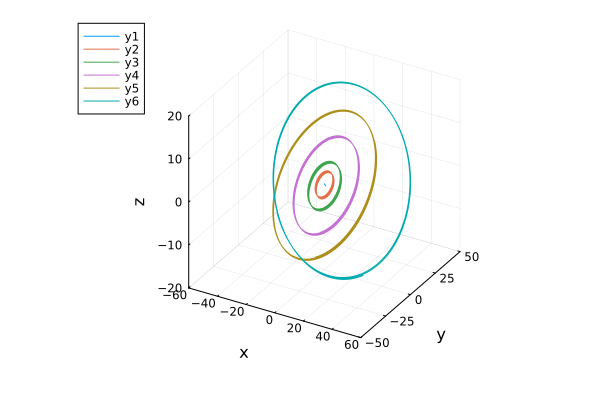

In [43]:
T=200000;   N=2000; # h = 200


s1,s2=Lobatto_IIIA_IIIB(fSolarT,fSolarV,T,q₀,p₀,N)

q6 = s1[:,1:18]
p6 = s2[:,1:18]

#gr(size=(800,900)); pyplot()


plot3d(q6[:,1],q6[:,2],q6[:,3])

plot3d!(q6[:,4],q6[:,5],q6[:,6])

plot3d!(q6[:,7],q6[:,8],q6[:,9])

plot3d!(q6[:,10],q6[:,11],q6[:,12])

plot3d!(q6[:,13],q6[:,14],q6[:,15])

plot3d!(q6[:,16],q6[:,17],q6[:,18])

plot3d!(xlims=(-60,60),ylims=(-50,50),zlims=(-20,20),xlabel="x",ylabel="y",zlabel="z")

In [44]:
H6,A6,L6=Constants(q6 ,p6 ,N+1);
t6=(0:N)*T/N;

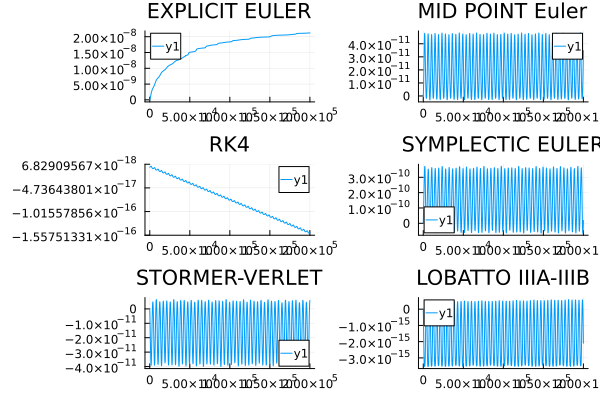

In [65]:
#pyplot()
u1 = plot(t1, H1 .-H1[1],title="EXPLICIT EULER");
u2 = plot(t2, H2 .-H2[1],title="MID POINT Euler");
u3 = plot(t3, H3 .-H3[1],title="RK4");
u4 = plot(t4, H4 .-H4[1],title="SYMPLECTIC EULER");
u5 = plot(t5, H5 .-H5[1],title="STORMER-VERLET");
u6 = plot(t6, H6 .-H6[1],title="LOBATTO IIIA-IIIB");


plot(u1,u2,u3,u4,u5,u6, layout = (3,2))

# Plot animation

In [ ]:
using  Plots;gr(size=(800,800));pyplot()

anim = @animate for i = 1:N
    
plot3d(
    xlims=(-60,60),
    ylims=(-50,50),
    zlims=(-20,20),
    xlabel="x",ylabel="y",
    zlabel="z",legend=false
    )
    plot3d!(qHist[1:i,1],qHist[1:i,2],qHist[1:i,3],lw=2)
plot3d!(qHist[1:i,4],qHist[1:i,5],qHist[1:i,6],lw=2)
plot3d!(qHist[1:i,7],qHist[1:i,8],qHist[1:i,9],lw=2)
plot3d!(qHist[1:i,10],qHist[1:i,11],qHist[1:i,12],lw=2)
plot3d!(qHist[1:i,13],qHist[1:i,14],qHist[1:i,15],lw=2)
plot3d!(qHist[1:i,16],qHist[1:i,17],qHist[1:i,18],lw=2)
end

gif(anim,"eulerE.gif",fps=20)